In [1]:
import sqlite3
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

import warnings
warnings.filterwarnings("ignore")

pd.set_option('display.max_columns', None)


db_path = 'data/olist.sqlite'
db_connection = sqlite3.connect(db_path)

In [2]:
# View tables from the database
tables = ['customers', 'orders', 'order_items', 'products', 'order_reviews', 'order_payments']



In [3]:
# Function to calculate missing and sparsity for each table
def calculate_sparsity(table_name):
    data = pd.read_sql_query(f"SELECT * FROM {table_name}", db_connection)
    total_entries = data.size
    missing_values = data.isnull().sum().sum()
    zero_values = (data == 0).sum().sum()  # Optional: Count zero values if needed
    total_sparse = missing_values + zero_values
    sparsity = (total_sparse / total_entries) * 100
    print(f"Table: {table_name}")
    print(f"Total Entries: {total_entries}")
    print(f"Missing Values: {missing_values}")
    print(f"Zero Values: {zero_values}")
    print(f"Sparsity: {sparsity:.2f}%")
    print("-" * 40)

# Calculate sparsity for each table
for table in tables:
    calculate_sparsity(table)


Table: customers
Total Entries: 497205
Missing Values: 0
Zero Values: 0
Sparsity: 0.00%
----------------------------------------
Table: orders
Total Entries: 795528
Missing Values: 4908
Zero Values: 0
Sparsity: 0.62%
----------------------------------------
Table: order_items
Total Entries: 788550
Missing Values: 0
Zero Values: 383
Sparsity: 0.05%
----------------------------------------
Table: products
Total Entries: 296559
Missing Values: 2448
Zero Values: 4
Sparsity: 0.83%
----------------------------------------
Table: order_reviews
Total Entries: 694568
Missing Values: 145903
Zero Values: 0
Sparsity: 21.01%
----------------------------------------
Table: order_payments
Total Entries: 519430
Missing Values: 0
Zero Values: 11
Sparsity: 0.00%
----------------------------------------


In [4]:
# Define the data for each table
tables = [
    {"name": "customers", "total_entries": 497205, "sparsity": 0.00},
    {"name": "orders", "total_entries": 795528, "sparsity": 0.62},
    {"name": "order_items", "total_entries": 788550, "sparsity": 0.05},
    {"name": "products", "total_entries": 296559, "sparsity": 0.83},
    {"name": "order_reviews", "total_entries": 694568, "sparsity": 21.01},
    {"name": "order_payments", "total_entries": 519430, "sparsity": 0.00},
]

# Calculate the overall sparsity
weighted_sparsity_sum = sum(table["total_entries"] * (table["sparsity"] / 100) for table in tables)
total_entries = sum(table["total_entries"] for table in tables)
overall_sparsity = (weighted_sparsity_sum / total_entries) * 100

# Print the result
print(f"Overall Sparsity: {overall_sparsity:.2f}%")


Overall Sparsity: 4.28%


In [5]:
# SQL Query to combine the tables
query = """
    SELECT
        c.customer_id,
        c.customer_unique_id,
        c.customer_zip_code_prefix,
        c.customer_city,
        c.customer_state,
        o.order_id,
        o.order_status,
        o.order_purchase_timestamp,
        o.order_delivered_customer_date,
        o.order_approved_at,
        o.order_estimated_delivery_date,
        r.review_score,
        r.review_comment_title,
        r.review_comment_message,
        p.payment_type,
        p.payment_installments,
        p.payment_value,
        i.product_id,
        i.price AS item_price,
        i.freight_value
    FROM customers c
    JOIN orders o
        ON c.customer_id = o.customer_id
    LEFT JOIN order_reviews r
        ON o.order_id = r.order_id
    LEFT JOIN order_payments p
        ON o.order_id = p.order_id
    LEFT JOIN order_items i
        ON o.order_id = i.order_id
"""

# Read the combined data into a pandas DataFrame
combined_data = pd.read_sql_query(query, db_connection)

# Close the database connection
db_connection.close()

# Display the first few rows
combined_data.head()




,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_delivered_customer_date,order_approved_at,order_estimated_delivery_date,review_score,review_comment_title,review_comment_message,payment_type,payment_installments,payment_value,product_id,item_price,freight_value
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,00e7ee1b050b8499577073aeb2a297a1,delivered,2017-05-16 15:05:35,2017-05-25 10:35:35,2017-05-16 15:22:12,2017-06-05 00:00:00,4.0,None,None,credit_card,2.0,146.87,a9516a079e37a9c9c36b9b78b10169e8,124.99,21.88
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP,29150127e6685892b6eab3eec79f59c7,delivered,2018-01-12 20:48:24,2018-01-29 12:41:19,2018-01-12 20:58:32,2018-02-06 00:00:00,5.0,None,None,credit_card,8.0,335.48,4aa6014eceb682077f9dc4bffebc05b0,289.00,46.48
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP,b2059ed67ce144a36e2aa97d2c9e9ad2,delivered,2018-05-19 16:07:45,2018-06-14 17:58:51,2018-05-20 16:19:10,2018-06-13 00:00:00,5.0,None,None,credit_card,7.0,157.73,bd07b66896d6f1494f5b86251848ced7,139.94,17.79
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP,951670f92359f4fe4a63112aa7306eba,delivered,2018-03-13 16:06:38,2018-03-28 16:04:25,2018-03-13 17:29:19,2018-04-10 00:00:00,5.0,None,None,credit_card,1.0,173.30,a5647c44af977b148e0a3a4751a09e2e,149.94,23.36
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP,6b7d50bd145f6fc7f33cebabd7e49d0f,delivered,2018-07-29 09:51:30,2018-08-09 20:55:48,2018-07-29 10:10:09,2018-08-15 00:00:00,5.0,a melhor nota,O baratheon è esxelente Amo adoro o baratheon,credit_card,8.0,252.25,9391a573abe00141c56e38d84d7d5b3b,230.00,22.25


In [6]:
combined_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119143 entries, 0 to 119142
Data columns (total 20 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   customer_id                    119143 non-null  object 
 1   customer_unique_id             119143 non-null  object 
 2   customer_zip_code_prefix       119143 non-null  int64  
 3   customer_city                  119143 non-null  object 
 4   customer_state                 119143 non-null  object 
 5   order_id                       119143 non-null  object 
 6   order_status                   119143 non-null  object 
 7   order_purchase_timestamp       119143 non-null  object 
 8   order_delivered_customer_date  115722 non-null  object 
 9   order_approved_at              118966 non-null  object 
 10  order_estimated_delivery_date  119143 non-null  object 
 11  review_score                   118146 non-null  float64
 12  review_comment_title          

In [7]:
from data_processor import  DataFrameProcessor

# Create an instance of DataFrameProcessor

In [8]:
# Create an instance of DataFrameProcessor
processor = DataFrameProcessor(combined_data)

Processed column names: ['customer_id', 'customer_unique_id', 'customer_zip_code_prefix', 'customer_city', 'customer_state', 'order_id', 'order_status', 'order_purchase_timestamp', 'order_delivered_customer_date', 'order_approved_at', 'order_estimated_delivery_date', 'review_score', 'review_comment_title', 'review_comment_message', 'payment_type', 'payment_installments', 'payment_value', 'product_id', 'item_price', 'freight_value']


In [9]:
unnecessary_columns = [
    "customer_city",
    "customer_state",
    "customer_zip_code_prefix",
    "review_comment_title",
    "review_comment_message",
    "order_status",
    "order_purchase_timestamp",
    "order_delivered_customer_date",
    "order_approved_at",
    "order_estimated_delivery_date",
    "payment_type",
    "payment_installments",
    "review_score"
]


# Remove unnecessary columns

In [10]:
# Remove unnecessary columns
processor.remove_columns(unnecessary_columns)


Removed unnecessary columns: ['customer_city', 'customer_state', 'customer_zip_code_prefix', 'review_comment_title', 'review_comment_message', 'order_status', 'order_purchase_timestamp', 'order_delivered_customer_date', 'order_approved_at', 'order_estimated_delivery_date', 'payment_type', 'payment_installments', 'review_score']


# Handle duplicates and Missing Values

In [11]:
# Run processing methods
processor.handle_duplicate_na()


Number of duplicate rows: 11945
Number of duplicate rows after removal: 0

Initial percentage of missing values:
product_id            0.76
item_price            0.76
freight_value         0.76
customer_id           0.00
customer_unique_id    0.00
order_id              0.00
payment_value         0.00
dtype: float64

Rows with missing values in Index(['product_id', 'item_price', 'freight_value', 'customer_id',
       'customer_unique_id', 'order_id', 'payment_value'],
      dtype='object') with less than 5% missing data were dropped.

Updated percentage of missing values:
customer_id           0.0
customer_unique_id    0.0
order_id              0.0
payment_value         0.0
product_id            0.0
item_price            0.0
freight_value         0.0
dtype: float64 


Final check for missing values in the entire DataFrame:
customer_id           0
customer_unique_id    0
order_id              0
payment_value         0
product_id            0
item_price            0
freight_value         

# Handle outliers


variables with outliers: ['payment_value', 'item_price', 'freight_value']

Box plots for quantitative variables (before handling outliers):


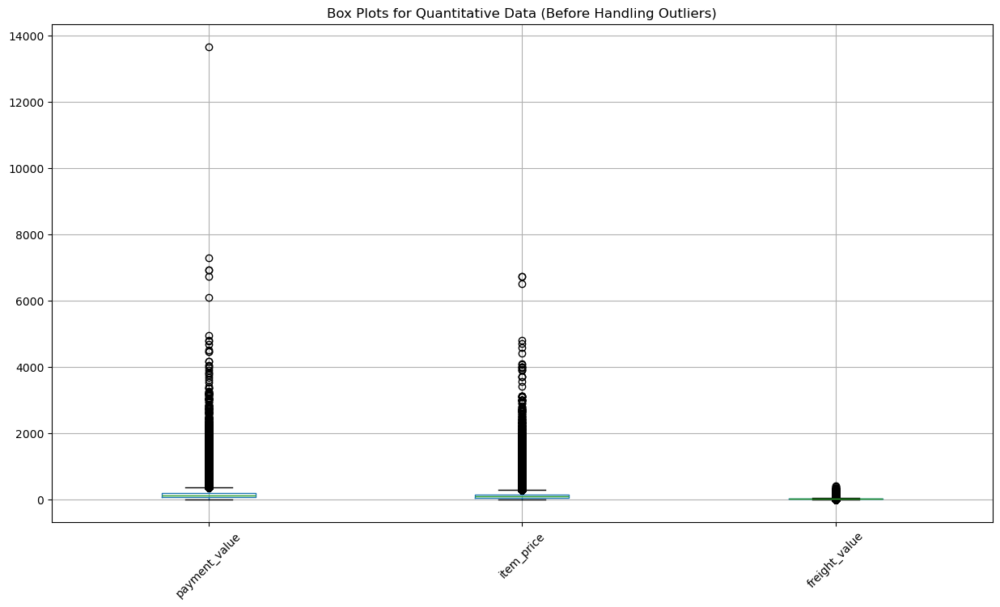


Box plots for quantitative variables (after handling outliers):


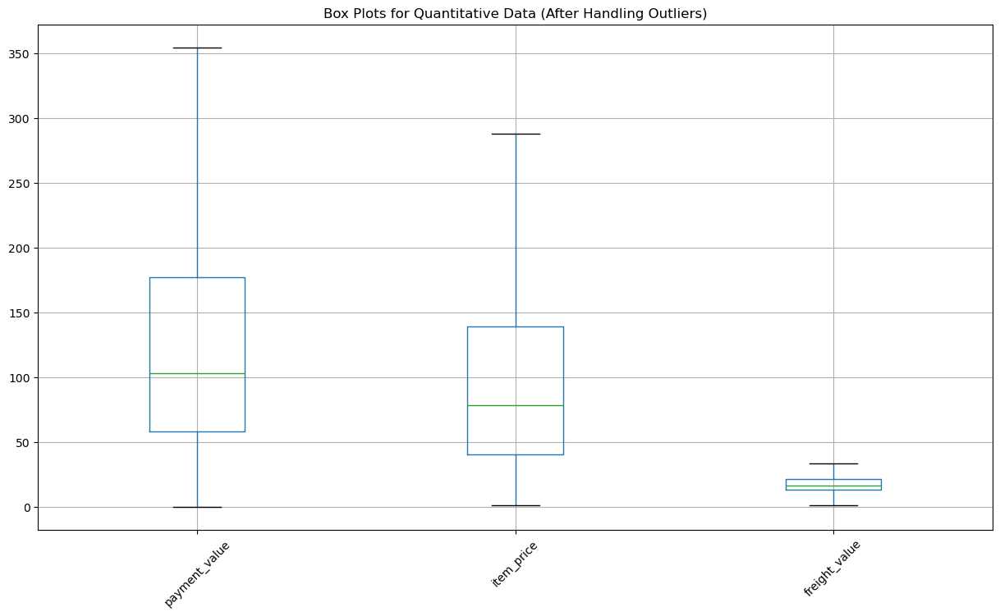

In [12]:
processor.handle_quantitative_outliers()

# Encoding process is not needed for clustering

In [13]:
processor.get_processed_df()

,customer_id,customer_unique_id,order_id,payment_value,product_id,item_price,freight_value
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,00e7ee1b050b8499577073aeb2a297a1,146.870,a9516a079e37a9c9c36b9b78b10169e8,124.99,21.88
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,29150127e6685892b6eab3eec79f59c7,335.480,4aa6014eceb682077f9dc4bffebc05b0,287.50,33.40
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,b2059ed67ce144a36e2aa97d2c9e9ad2,157.730,bd07b66896d6f1494f5b86251848ced7,139.94,17.79
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,951670f92359f4fe4a63112aa7306eba,173.300,a5647c44af977b148e0a3a4751a09e2e,149.94,23.36
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,6b7d50bd145f6fc7f33cebabd7e49d0f,252.250,9391a573abe00141c56e38d84d7d5b3b,230.00,22.25
...,...,...,...,...,...,...,...
119138,17ddf5dd5d51696bb3d7c6291687be6f,1a29b476fee25c95fbafc67c5ac95cf8,6760e20addcf0121e9d58f2f1ff14298,88.780,ccb4503d9d43d245d3b295d0544f988b,74.90,13.88
119139,e7b71a9017aa05c9a7fd292d714858e8,d52a67c98be1cf6a5c84435bd38d095d,9ec0c8947d973db4f4e8dcf1fbfa8f1b,129.060,9ede6b0570a75a4b9de4f383329f99ee,114.90,14.16
119140,5e28dfe12db7fb50a4b2f691faecea5e,e9f50caf99f032f0bf3c55141f019d99,fed4434add09a6f332ea398efd656a5c,56.040,7a5d2e1e131a860ae7d18f6fffa9d689,37.00,19.04
119141,56b18e2166679b8a959d72dd06da27f9,73c2643a0a458b49f58cea58833b192e,e31ec91cea1ecf97797787471f98a8c2,354.495,f819f0c84a64f02d3a5606ca95edd272,287.50,22.07


In [14]:
df=processor.get_processed_df()

In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 106386 entries, 0 to 119142
Data columns (total 7 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   customer_id         106386 non-null  object 
 1   customer_unique_id  106386 non-null  object 
 2   order_id            106386 non-null  object 
 3   payment_value       106386 non-null  float64
 4   product_id          106386 non-null  object 
 5   item_price          106386 non-null  float64
 6   freight_value       106386 non-null  float64
dtypes: float64(3), object(4)
memory usage: 6.5+ MB


# Feature Engineering

In [16]:
df['order_value'] = df['item_price'] + df['freight_value']


In [17]:
aov = df.groupby('customer_id').agg(
    total_order_value=('order_value', 'sum'),
    total_orders=('order_id', 'nunique')
)

aov.head()

,total_order_value,total_orders
customer_id,,
00012a2ce6f8dcda20d059ce98491703,114.74,1
000161a058600d5901f007fab4c27140,67.41,1
0001fd6190edaaf884bcaf3d49edf079,195.42,1
0002414f95344307404f0ace7a26f1d5,179.35,1
000379cdec625522490c315e70c7a9fb,107.01,1


In [18]:
aov['aov'] = aov['total_order_value'] / aov['total_orders']

In [19]:
df = df.merge(aov[['aov']], on='customer_id', how='left')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 106386 entries, 0 to 106385
Data columns (total 9 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   customer_id         106386 non-null  object 
 1   customer_unique_id  106386 non-null  object 
 2   order_id            106386 non-null  object 
 3   payment_value       106386 non-null  float64
 4   product_id          106386 non-null  object 
 5   item_price          106386 non-null  float64
 6   freight_value       106386 non-null  float64
 7   order_value         106386 non-null  float64
 8   aov                 106386 non-null  float64
dtypes: float64(5), object(4)
memory usage: 7.3+ MB


In [20]:
print(df.head())

                        customer_id                customer_unique_id  \
0  06b8999e2fba1a1fbc88172c00ba8bc7  861eff4711a542e4b93843c6dd7febb0   
1  18955e83d337fd6b2def6b18a428ac77  290c77bc529b7ac935b93aa66c333dc3   
2  4e7b3e00288586ebd08712fdd0374a03  060e732b5b29e8181a18229c7b0b2b5e   
3  b2b6027bc5c5109e529d4dc6358b12c3  259dac757896d24d7702b9acbbff3f3c   
4  4f2d8ab171c80ec8364f7c12e35b23ad  345ecd01c38d18a9036ed96c73b8d066   

                           order_id  payment_value  \
0  00e7ee1b050b8499577073aeb2a297a1         146.87   
1  29150127e6685892b6eab3eec79f59c7         335.48   
2  b2059ed67ce144a36e2aa97d2c9e9ad2         157.73   
3  951670f92359f4fe4a63112aa7306eba         173.30   
4  6b7d50bd145f6fc7f33cebabd7e49d0f         252.25   

                         product_id  item_price  freight_value  order_value  \
0  a9516a079e37a9c9c36b9b78b10169e8      124.99          21.88       146.87   
1  4aa6014eceb682077f9dc4bffebc05b0      287.50          33.40       320.90   

In [21]:
from sklearn.preprocessing import StandardScaler

# Select numeric columns to scale
numeric_columns = [col for col in df.select_dtypes(include=['int', 'float']).columns]

# Create a scaler instance
scaler = StandardScaler()

# Fit and transform the numeric columns
scaled_data = scaler.fit_transform(df[numeric_columns])

# Replace the original numeric columns with the scaled values
df_scaled = df.copy()
df_scaled[numeric_columns] = scaled_data

# Write transformed dataset to CSV
df_scaled.to_csv('df_scaled.csv', index=False)

# Display the scaled dataset
print(df_scaled.head())


                        customer_id                customer_unique_id  \
0  06b8999e2fba1a1fbc88172c00ba8bc7  861eff4711a542e4b93843c6dd7febb0   
1  18955e83d337fd6b2def6b18a428ac77  290c77bc529b7ac935b93aa66c333dc3   
2  4e7b3e00288586ebd08712fdd0374a03  060e732b5b29e8181a18229c7b0b2b5e   
3  b2b6027bc5c5109e529d4dc6358b12c3  259dac757896d24d7702b9acbbff3f3c   
4  4f2d8ab171c80ec8364f7c12e35b23ad  345ecd01c38d18a9036ed96c73b8d066   

                           order_id  payment_value  \
0  00e7ee1b050b8499577073aeb2a297a1       0.154184   
1  29150127e6685892b6eab3eec79f59c7       2.107467   
2  b2059ed67ce144a36e2aa97d2c9e9ad2       0.266652   
3  951670f92359f4fe4a63112aa7306eba       0.427898   
4  6b7d50bd145f6fc7f33cebabd7e49d0f       1.245520   

                         product_id  item_price  freight_value  order_value  \
0  a9516a079e37a9c9c36b9b78b10169e8    0.300025       0.530027     0.335420   
1  4aa6014eceb682077f9dc4bffebc05b0    2.370801       2.075995     2.458475   

In [22]:
df_scaled.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 106386 entries, 0 to 106385
Data columns (total 9 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   customer_id         106386 non-null  object 
 1   customer_unique_id  106386 non-null  object 
 2   order_id            106386 non-null  object 
 3   payment_value       106386 non-null  float64
 4   product_id          106386 non-null  object 
 5   item_price          106386 non-null  float64
 6   freight_value       106386 non-null  float64
 7   order_value         106386 non-null  float64
 8   aov                 106386 non-null  float64
dtypes: float64(5), object(4)
memory usage: 7.3+ MB


In [23]:
from scipy.stats import shapiro

# Select numeric columns to test for normality
numeric_columns = [col for col in df_scaled.select_dtypes(include=['float', 'int']).columns]

# Apply the Shapiro-Wilk test to each numeric column
for col in numeric_columns:
    stat, p_value = shapiro(df_scaled[col])
    print(f"Column: {col}")
    print(f"Shapiro-Wilk Test Statistic: {stat:.4f}, p-value: {p_value:.4f}")
    if p_value > 0.05:
        print(f"Result: {col} appears to be normally distributed (p > 0.05)\n")
    else:
        print(f"Result: {col} does NOT appear to be normally distributed (p <= 0.05)\n")


Column: payment_value
Shapiro-Wilk Test Statistic: 0.8741, p-value: 0.0000
Result: payment_value does NOT appear to be normally distributed (p <= 0.05)

Column: item_price
Shapiro-Wilk Test Statistic: 0.8628, p-value: 0.0000
Result: item_price does NOT appear to be normally distributed (p <= 0.05)

Column: freight_value
Shapiro-Wilk Test Statistic: 0.9238, p-value: 0.0000
Result: freight_value does NOT appear to be normally distributed (p <= 0.05)

Column: order_value
Shapiro-Wilk Test Statistic: 0.8735, p-value: 0.0000
Result: order_value does NOT appear to be normally distributed (p <= 0.05)

Column: aov
Shapiro-Wilk Test Statistic: 0.3830, p-value: 0.0000
Result: aov does NOT appear to be normally distributed (p <= 0.05)



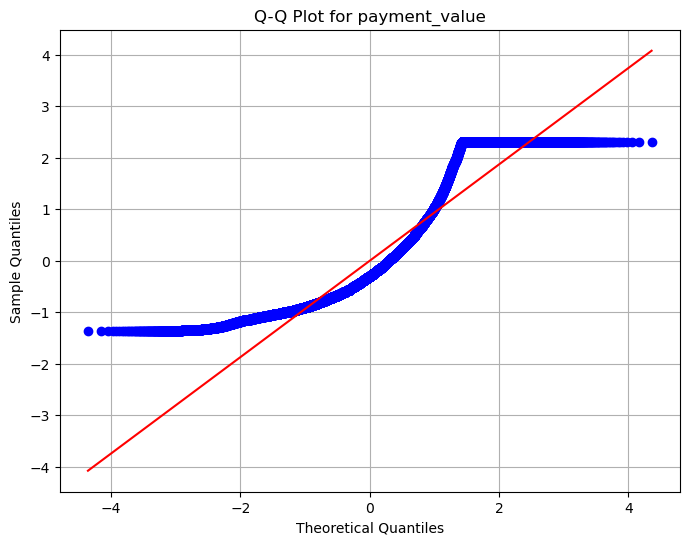

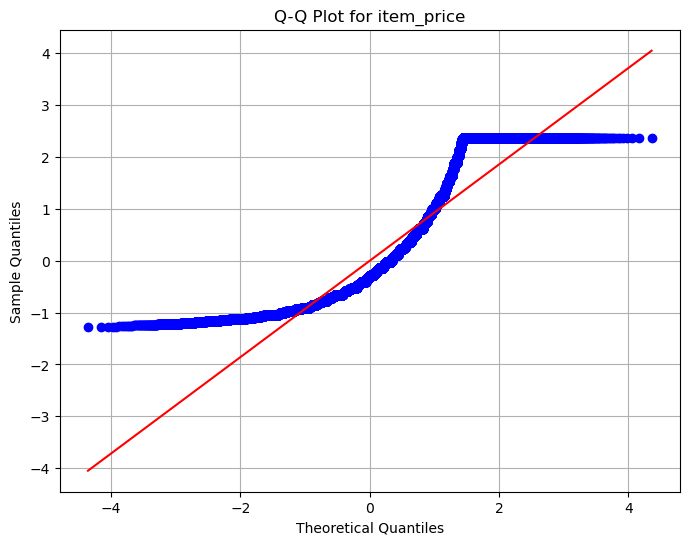

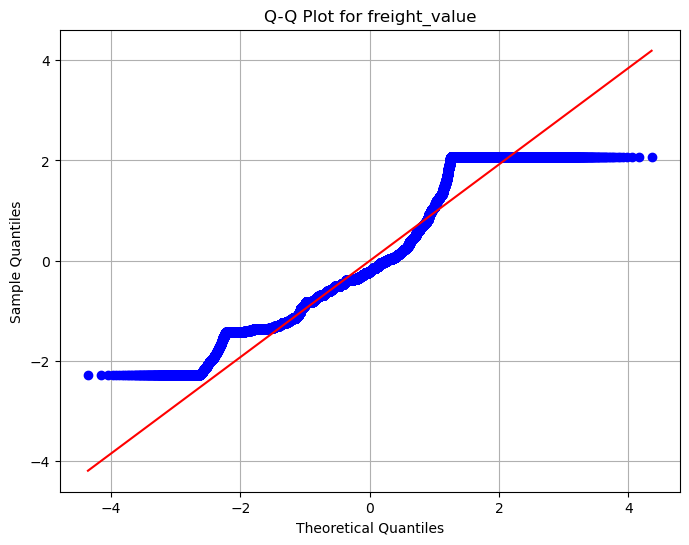

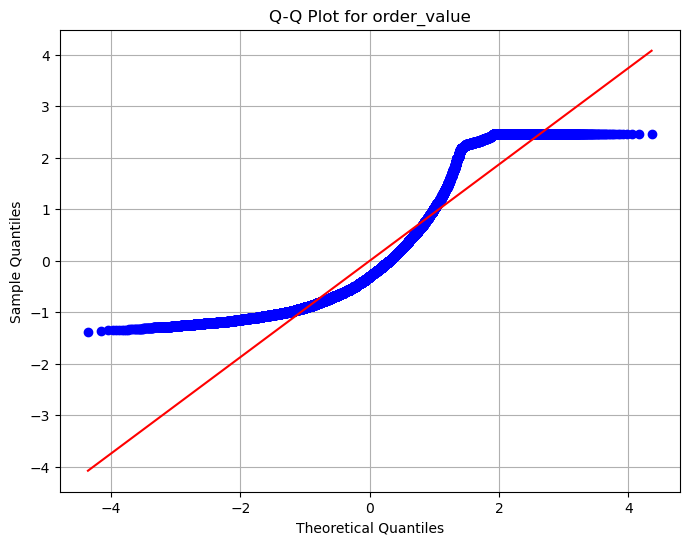

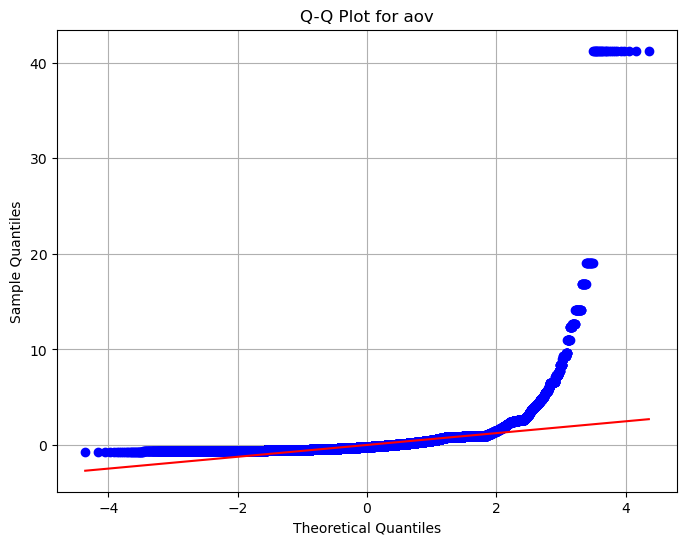

In [24]:
import matplotlib.pyplot as plt
from scipy.stats import probplot

# Define a function to generate Q-Q plots for each numeric column
def generate_qq_plot(df, column_name):
    plt.figure(figsize=(8, 6))
    probplot(df[column_name], dist="norm", plot=plt)
    plt.title(f"Q-Q Plot for {column_name}")
    plt.xlabel("Theoretical Quantiles")
    plt.ylabel("Sample Quantiles")
    plt.grid(True)
    plt.show()

# List of numeric columns to generate Q-Q plots
numeric_columns = [col for col in df_scaled.select_dtypes(include=['float64', 'int64']).columns]

# Generate Q-Q plots for each numeric column in df_scaled
for col in numeric_columns:
    generate_qq_plot(df_scaled, col)


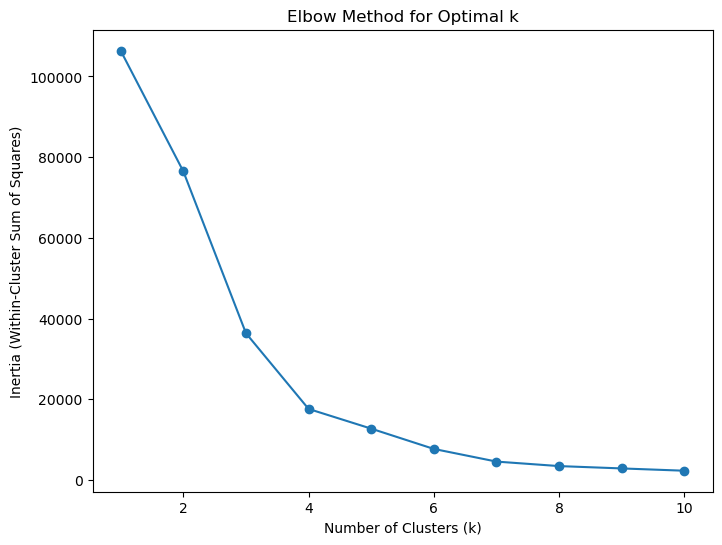

In [25]:
from sklearn.cluster import KMeans

# Load the scaled dataset
clustering_data = df_scaled[['aov']]  # Use only the scaled AOV column for clustering

# Step 1: Choose the Number of Clusters Using the Elbow Method
inertia = []
cluster_range = range(1, 11)

# Calculate inertia for each number of clusters
for k in cluster_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(clustering_data)
    inertia.append(kmeans.inertia_)

# Plot the Elbow Method to visualize the optimal number of clusters
plt.figure(figsize=(8, 6))
plt.plot(cluster_range, inertia, marker='o')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia (Within-Cluster Sum of Squares)')
plt.title('Elbow Method for Optimal k')
plt.show()

In [26]:
# Step 2: Perform Clustering with Optimal k 
optimal_k = 4  # Choose the number based on the Elbow plot
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
clusters = kmeans.fit_predict(clustering_data)

# Add cluster labels to the original DataFrame
df_scaled['aov_cluster'] = clusters

# Step 3: Analyze the resulting clusters
cluster_summary = df_scaled.groupby('aov_cluster')['aov'].mean()
print("\nCluster Summary (Mean AOV):")
print(cluster_summary)


Cluster Summary (Mean AOV):
aov_cluster
0    -0.275727
1     0.816044
2    41.264351
3     7.474180
Name: aov, dtype: float64


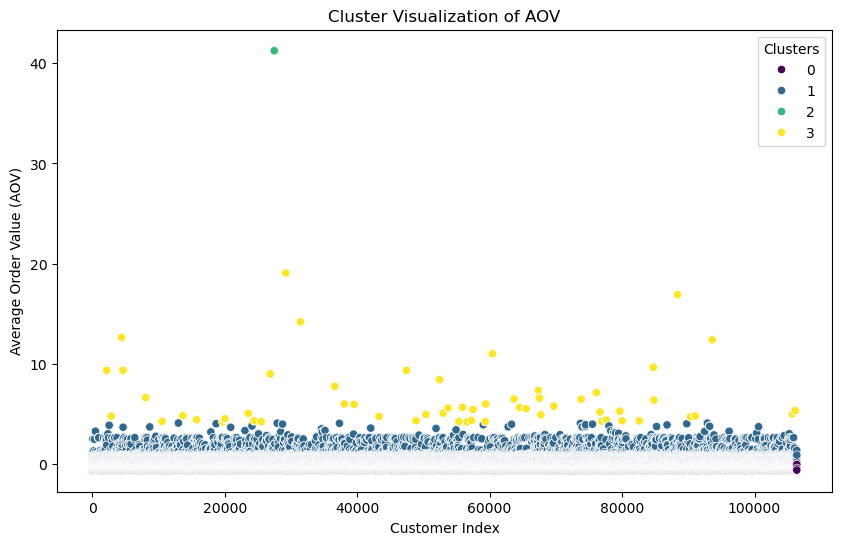

In [27]:
import matplotlib.pyplot as plt
import seaborn as sns

# Scatter plot to visualize clusters
plt.figure(figsize=(10, 6))
sns.scatterplot(
    x=range(len(df_scaled)),  # Index values to spread points on x-axis
    y=df_scaled['aov'],  # AOV values on the y-axis
    hue=df_scaled['aov_cluster'],  # Color-code by clusters
    palette="viridis",  # Color palette for clusters
    legend="full"
)

# Adding plot labels and title
plt.xlabel("Customer Index")
plt.ylabel("Average Order Value (AOV)")
plt.title("Cluster Visualization of AOV")
plt.legend(title="Clusters")
plt.show()


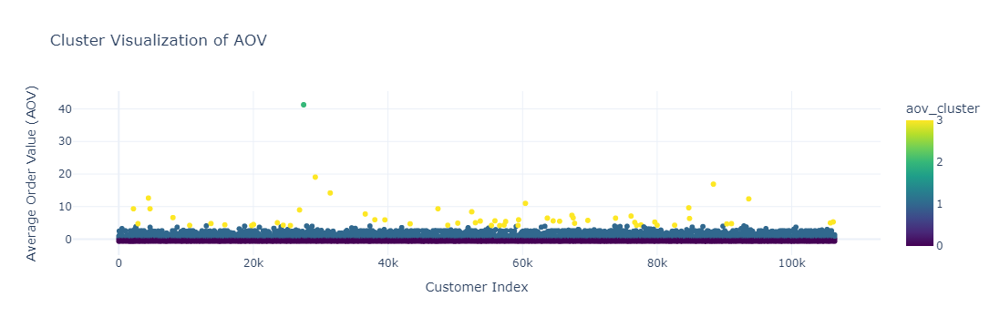

In [28]:
import plotly.express as px

# Create a scatter plot to visualize clusters
fig = px.scatter(
    df_scaled,
    x=range(len(df_scaled)),  # Index values to spread points on x-axis
    y='aov',  # AOV values on the y-axis
    color='aov_cluster',  # Color-code by clusters
    color_continuous_scale="Viridis",  # Color palette for clusters
    title="Cluster Visualization of AOV",
    labels={"x": "Customer Index", "y": "Average Order Value (AOV)", "color": "Cluster"}
)

# Update layout for better visualization
fig.update_layout(
    xaxis_title="Customer Index",
    yaxis_title="Average Order Value (AOV)",
    legend_title="Clusters",
    template="plotly_white"
)

# Show the plot
fig.show()


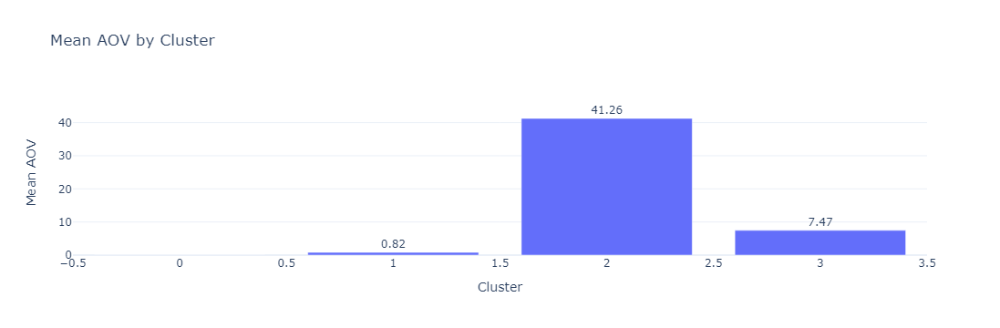

In [29]:
import plotly.express as px

# Bar chart of mean AOV by cluster
cluster_summary = df_scaled.groupby('aov_cluster')['aov'].mean().reset_index()
fig = px.bar(
    cluster_summary,
    x='aov_cluster',
    y='aov',
    title='Mean AOV by Cluster',
    labels={'aov_cluster': 'Cluster', 'aov': 'Mean AOV'},
    text='aov'  # Add text to display values on the bars
)

# Update text formatting and layout
fig.update_traces(
    texttemplate='%{text:.2f}',  # Format text to two decimal places
    textposition='outside'  # Place text above the bars
)
fig.update_layout(
    template='plotly_white',
    yaxis_title='Mean AOV',
    xaxis_title='Cluster',
    yaxis_range=[0, cluster_summary['aov'].max() * 1.2]  # Add padding above the tallest bar
)

# Show the plot
fig.show()


In [30]:
from scipy.stats import f_oneway

# Perform ANOVA across clusters
clusters = [df_scaled[df_scaled['aov_cluster'] == i]['aov'] for i in range(4)]
anova_result = f_oneway(*clusters)
print(f"ANOVA Statistic: {anova_result.statistic}, p-value: {anova_result.pvalue}")


ANOVA Statistic: 179080.34295544404, p-value: 0.0


In [31]:
from scipy.stats import kruskal

# Perform the Kruskal-Wallis test
clusters = [df_scaled[df_scaled['aov_cluster'] == i]['aov'] for i in range(4)]
kruskal_result = kruskal(*clusters)

# Print the result
print(f"Kruskal-Wallis Statistic: {kruskal_result.statistic:.4f}, p-value: {kruskal_result.pvalue}")

# Interpret the result
if kruskal_result.pvalue <= 0.05:
    print("Result: There are significant differences in AOV across the clusters (reject the null hypothesis).")
else:
    print("Result: There are no significant differences in AOV across the clusters (fail to reject the null hypothesis).")


Kruskal-Wallis Statistic: 54555.6175, p-value: 0.0
Result: There are significant differences in AOV across the clusters (reject the null hypothesis).


# To calculate the projected revenue growth for Cluster 2

In [32]:
# Calculate the number of customers in Cluster 2
cluster_2_customers = df_scaled[df_scaled['aov_cluster'] == 2]  # Filter for Cluster 2
N2 = len(cluster_2_customers)  # Count customers in Cluster 2
print(f"Number of customers in Cluster 2: {N2}")

# Debug: Print cluster_summary to check the index type
print("Cluster Summary:")
print(cluster_summary)

# Ensure cluster_summary is properly indexed and fetches a scalar value
current_aov_cluster_2 = cluster_summary[cluster_summary['aov_cluster']==2].aov.values[0]
current_aov_cluster_2

Number of customers in Cluster 2: 25
Cluster Summary:
   aov_cluster        aov
0            0  -0.275727
1            1   0.816044
2            2  41.264351
3            3   7.474180


41.26435104559748

In [33]:
# Step 5: Projected Revenue Growth for Cluster 2
projected_aov_cluster_2 = current_aov_cluster_2 * 1.1  # Assume 10% increase
projected_revenue_increase = (projected_aov_cluster_2 - current_aov_cluster_2) * N2

# Print the projected revenue increase
print(f"Projected annual revenue increase for Cluster 2: ${projected_revenue_increase:.0f}")

Projected annual revenue increase for Cluster 2: $103


# Determine the number of customers in Cluster 0 (Low-Value Customers)

In [34]:
cluster_0_customers = df_scaled[df_scaled['aov_cluster'] == 0]
N0 = len(cluster_0_customers)  # Number of customers in Cluster 0
print(f"Number of customers in Cluster 0: {N0}")


Number of customers in Cluster 0: 83146


# Calculate the current average AOV of Cluster 0:

In [35]:
current_aov_cluster_0 = cluster_summary[cluster_summary['aov_cluster']==0].aov.values[0]  # Fetch mean AOV for Cluster 0
print(f"Current AOV for Cluster 0: {current_aov_cluster_0}")

Current AOV for Cluster 0: -0.2757272953923066


```
Assume conversion of 20% of Cluster 0 to moderate or high-value customers:

conversion_rate = 0.20 (20% of customers in Cluster 0)
converted_customers = N0 * conversion_rate
```

In [36]:
conversion_rate = 0.20
converted_customers = N0 * conversion_rate

# Estimate the new average AOV for converted customers: Assume converted customers achieve an AOV equivalent to Cluster 3 (Moderately High AOV Customers):

In [37]:
target_aov_cluster_3 =  cluster_summary[cluster_summary['aov_cluster']==3].aov.values[0]  # Mean AOV for Cluster 3
print(f"Target AOV for converted customers: {target_aov_cluster_3}")


Target AOV for converted customers: 7.474180299630797


# Calculate the projected revenue uplift: Use the difference in AOV between Cluster 3 and Cluster 0 to estimate the revenue increase:

In [38]:
projected_revenue_increase = converted_customers * (target_aov_cluster_3 - current_aov_cluster_0)
print(f"Projected annual revenue uplift: ${projected_revenue_increase:.0f}")


Projected annual revenue uplift: $128875
